# DBSCAN CLUSTERING

##
A.Imports
i. Imports libraries and re-editing the mall datasets
ii. Import dependencies

B.EDA
i. Data Cleaning
ii. Data analysis and pre-processing

C. Model Development
i. K-Means Clustering
ii. Hierarchical(Agglomerative) Clustering
iii. DBSCAN Clsutering

D. Evaluation
i Elbow Method
ii. Silhoutte Analysis
iii. Silhoutte Score

E. Data Analysis
i. Females underage group of 25-35 years do massive shopping
ii. Annual Income and Spending Score is led by female
iii. Correlations between Age, Annual Income and Spending Score
iv. Scatter plot and heatmap visualizations

## A.Imports
i. Imports libraries and re-editing the mall datasets
ii. Import dependencies

In [66]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import seaborn as sns

In [67]:
pip install plotly

Note: you may need to restart the kernel to use updated packages.


In [68]:
%matplotlib inline

In [69]:
import plotly.express as px
from plotly.offline import init_notebook_mode
init_notebook_mode(connected=True)

In [70]:
#LOADING DATASET
df = pd.read_excel(("/Users/binitashrestha/Documents/CopyMall.xlsx"))

In [71]:
#LENGTH OF DATASET
df.shape

(370213, 5)

In [72]:
#OVERVIEW OF DATASET
df.head()

,CustomerID,Gender,Age,Annual Income (k$),Spending Score (1-100)
0,1.0,Male,19.0,15.0,39.0
1,2.0,Male,21.0,15.0,81.0
2,3.0,Female,20.0,16.0,6.0
3,4.0,Female,23.0,16.0,77.0
4,5.0,Female,31.0,17.0,40.0


In [73]:
#OVERVIEW OF DATASET
df.describe()

,CustomerID,Age,Annual Income (k$),Spending Score (1-100)
count,66237.000000,367779.000000,365816.000000,366965.000000
mean,69997.716790,38.860889,60.366274,50.198142
std,85713.328731,13.953249,26.113443,25.734476
min,1.000000,18.000000,15.000000,1.000000
25%,16560.000000,28.000000,40.000000,35.000000
50%,33119.000000,36.000000,61.000000,50.000000
75%,74872.000000,49.000000,78.000000,73.000000
max,370214.000000,70.000000,137.000000,99.000000


In [74]:
#OVERVIEW OF DATASET
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 370213 entries, 0 to 370212
Data columns (total 5 columns):
 #   Column                  Non-Null Count   Dtype  
---  ------                  --------------   -----  
 0   CustomerID              66237 non-null   float64
 1   Gender                  369085 non-null  object 
 2   Age                     367779 non-null  float64
 3   Annual Income (k$)      365816 non-null  float64
 4   Spending Score (1-100)  366965 non-null  float64
dtypes: float64(4), object(1)
memory usage: 14.1+ MB


In [75]:
# #Discarding customerID since it has 90% rows of null values.
# df.drop('CustomerID',axis=1,inplace=True)

In [76]:
#LENGTH OF DATASET
df.shape

(370213, 5)

# B. EDA
i. Data Cleaning
ii. Data analysis and pre-processing

In [77]:
#FINDING ROWS WITH NULLS VALUES
df.isna().sum().to_frame(name='# of missing values')

,# of missing values
CustomerID,303976
Gender,1128
Age,2434
Annual Income (k$),4397
Spending Score (1-100),3248


In [78]:
####REMOVE ALL ROWS WITH NULL VALUES
total_rows =  df.shape[0]
df.dropna(how='any',inplace=True)
remaining_rows= df.shape[0]

removed_rows = total_rows-remaining_rows
print("No. of rows removed :", removed_rows)

print(f"\nPercentage of data removed:{np.round((removed_rows/total_rows)*100,2)}%")
print(f"Percentage of data remaining:{np.round((remaining_rows/total_rows)*100,2)}%")

No. of rows removed : 304948

Percentage of data removed:82.37%
Percentage of data remaining:17.63%


In [79]:
df.shape

(65265, 5)

In [80]:
#OVERVIEW OF COLUMNS AVAILABLE
df.columns

Index(['CustomerID', 'Gender', 'Age', 'Annual Income (k$)',
       'Spending Score (1-100)'],
      dtype='object')

<Figure size 432x288 with 0 Axes>

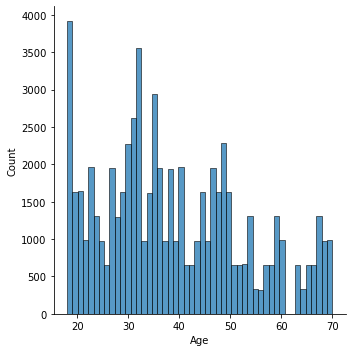

<Figure size 432x288 with 0 Axes>

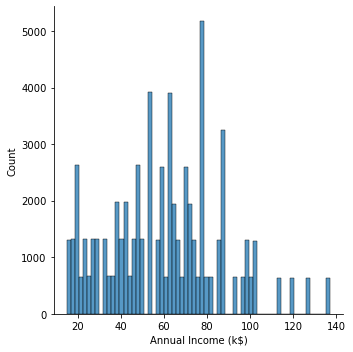

<Figure size 432x288 with 0 Axes>

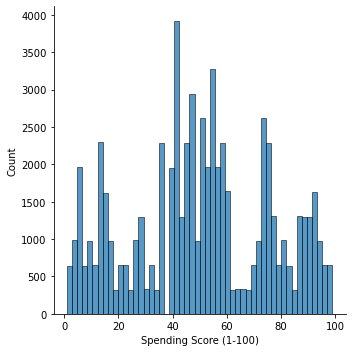

In [81]:
#PLOTING OF GENDER, ANNUAL INCOME AND SPENDING SCORE
columns=['Age', 'Annual Income (k$)','Spending Score (1-100)']
for i in columns:
    plt.figure()
    sns.displot(df[i])

<AxesSubplot:xlabel='Annual Income (k$)', ylabel='Density'>

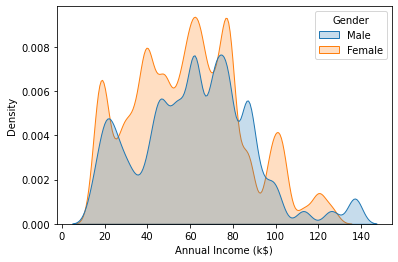

In [82]:
sns.kdeplot(df['Annual Income (k$)'], shade= True, hue= df['Gender'])

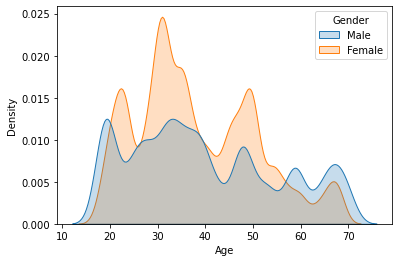

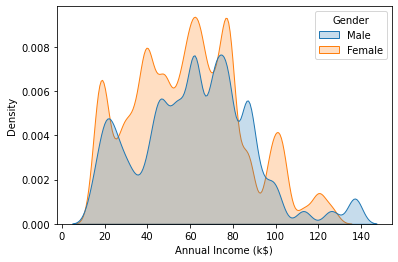

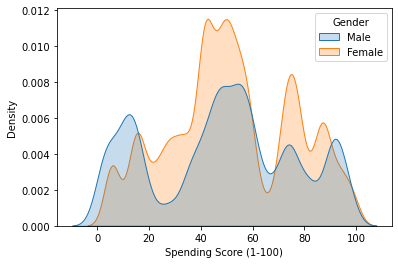

In [83]:
columns=['Age', 'Annual Income (k$)','Spending Score (1-100)']
for i in columns:
    plt.figure()
    sns.kdeplot(df[i], shade= True, hue= df['Gender'])

In [84]:
#number of values of male and female
df['Gender'].value_counts()

Female    36565
Male      28700
Name: Gender, dtype: int64

In [85]:
df['Gender'].value_counts(normalize= True)

Female    0.560254
Male      0.439746
Name: Gender, dtype: float64

In [86]:
import warnings
warnings.filterwarnings('ignore')

In [87]:
df.groupby(['Gender'])['Age', 'Annual Income (k$)',
       'Spending Score (1-100)'].mean()

,Age,Annual Income (k$),Spending Score (1-100)
Gender,,,
Female,38.100096,59.037085,51.514290
Male,39.825610,62.001568,48.526934


In [88]:
df.corr()

,CustomerID,Age,Annual Income (k$),Spending Score (1-100)
CustomerID,1.000000,0.000521,-0.002335,0.000012
Age,0.000521,1.000000,-0.011372,-0.328380
Annual Income (k$),-0.002335,-0.011372,1.000000,0.009907
Spending Score (1-100),0.000012,-0.328380,0.009907,1.000000


In [89]:
#Discarding customerID since it has 90% rows of null values.
df.drop('CustomerID',axis=1,inplace=True)

<AxesSubplot:xlabel='Annual Income (k$)', ylabel='Spending Score (1-100)'>

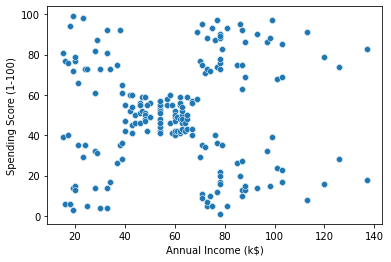

In [90]:
#annual income, gender and age for kmeans clustering
sns.scatterplot(data=df, x='Annual Income (k$)',y='Spending Score (1-100)' )

<AxesSubplot:>

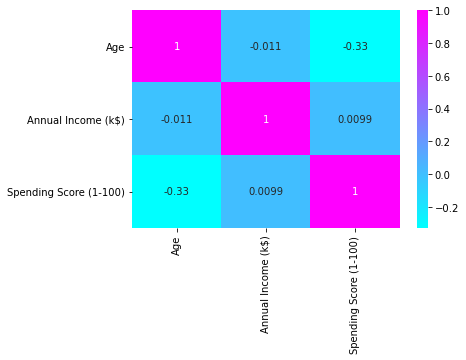

In [91]:
sns.heatmap(df.corr(), annot= True, cmap='cool')

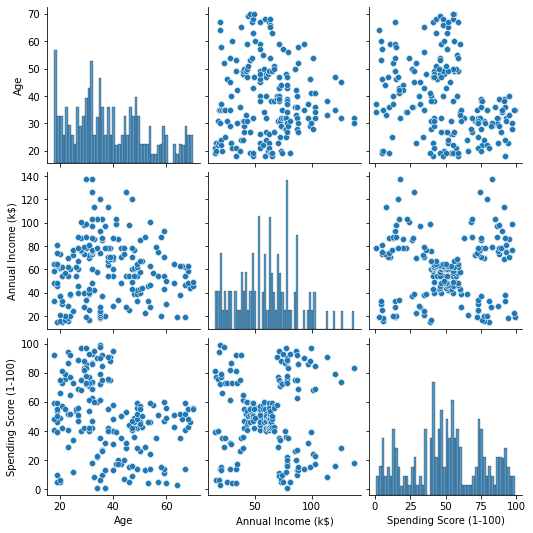

In [92]:
sns.pairplot(df)

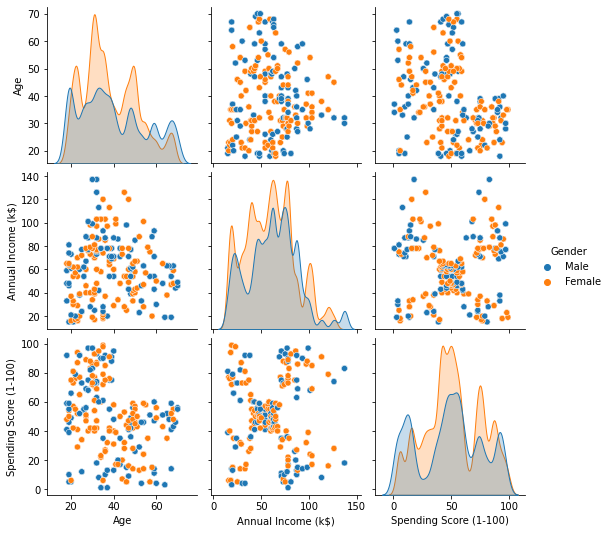

In [93]:
#VISUALIZATIONS WITHOUT CustomerID 
sns.pairplot(df, hue= 'Gender')

In [94]:
df['Gender'] = df['Gender'].apply(lambda x: 0 if x=='Male' else 1)

In [95]:
df['Gender']

0         0
1         0
2         1
3         1
4         1
         ..
309570    0
309571    1
309572    0
309573    1
309574    1
Name: Gender, Length: 65265, dtype: int64

In [96]:
df.columns

Index(['Gender', 'Age', 'Annual Income (k$)', 'Spending Score (1-100)'], dtype='object')

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
        34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50]),
 [Text(0, 0, '18.0'),
  Text(1, 0, '19.0'),
  Text(2, 0, '20.0'),
  Text(3, 0, '21.0'),
  Text(4, 0, '22.0'),
  Text(5, 0, '23.0'),
  Text(6, 0, '24.0'),
  Text(7, 0, '25.0'),
  Text(8, 0, '26.0'),
  Text(9, 0, '27.0'),
  Text(10, 0, '28.0'),
  Text(11, 0, '29.0'),
  Text(12, 0, '30.0'),
  Text(13, 0, '31.0'),
  Text(14, 0, '32.0'),
  Text(15, 0, '33.0'),
  Text(16, 0, '34.0'),
  Text(17, 0, '35.0'),
  Text(18, 0, '36.0'),
  Text(19, 0, '37.0'),
  Text(20, 0, '38.0'),
  Text(21, 0, '39.0'),
  Text(22, 0, '40.0'),
  Text(23, 0, '41.0'),
  Text(24, 0, '42.0'),
  Text(25, 0, '43.0'),
  Text(26, 0, '44.0'),
  Text(27, 0, '45.0'),
  Text(28, 0, '46.0'),
  Text(29, 0, '47.0'),
  Text(30, 0, '48.0'),
  Text(31, 0, '49.0'),
  Text(32, 0, '50.0'),
  Text(33, 0, '51.0')

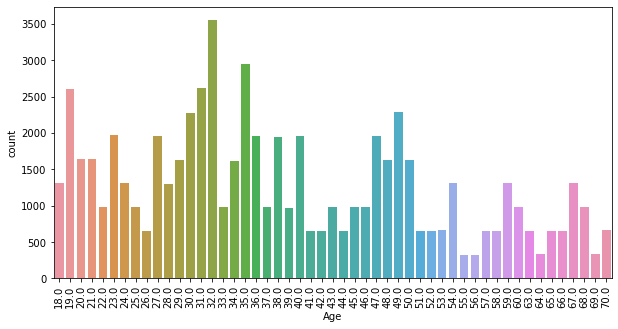

In [97]:
plt.figure(figsize=(10,5))
sns.countplot(df['Age'])
plt.xticks(rotation=90)

In [98]:
#OUTPUTS WITH GENDER ENCODING WITH NUMERICAL VALUES.
df.describe()

,Gender,Age,Annual Income (k$),Spending Score (1-100)
count,65265.000000,65265.000000,65265.000000,65265.000000
mean,0.560254,38.858883,60.340703,50.200613
std,0.496360,13.950542,26.152092,25.739818
min,0.000000,18.000000,15.000000,1.000000
25%,0.000000,28.000000,40.000000,35.000000
50%,1.000000,36.000000,61.000000,50.000000
75%,1.000000,49.000000,78.000000,73.000000
max,1.000000,70.000000,137.000000,99.000000


# C. MODEL DEVELOPMENT
iii. DBSCAN Clsutering

In [99]:
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_samples,silhouette_score
from sklearn.cluster import AgglomerativeClustering
from scipy.cluster.hierarchy import dendrogram
from sklearn.cluster import DBSCAN
from collections import Counter
from sklearn.decomposition import PCA

####Calling standard scaler function to remove the mean and scaling to unit variance. Here, the fit() function calculates the values of these parameters. The transform function applies the values of the parameters on the actual data and gives the normalized value. The fit_transform() function performs both in the same step. 

In [100]:
scaler = StandardScaler()
scaler.fit(df)
X = scaler.transform(df)

###DBSCAN model development with eps=1 and minimum samples =30 for each clusters. 

In [101]:
model = DBSCAN(eps=1,min_samples=30)
cluster_labels = model.fit_predict(X)

In [102]:
#few basic findings
model.fit(df[['Annual Income (k$)']])
model.labels_

array([0, 0, 0, ..., 6, 6, 6])

In [103]:
#adding model labels column to the initial dataframe
df['Income Cluster']= model.labels_
df.head(5)

,Gender,Age,Annual Income (k$),Spending Score (1-100),Income Cluster
0,0,19.0,15.0,39.0,0
1,0,21.0,15.0,81.0,0
2,1,20.0,16.0,6.0,0
3,1,23.0,16.0,77.0,0
4,1,31.0,17.0,40.0,0


In [104]:
df['Income Cluster'].value_counts

<bound method IndexOpsMixin.value_counts of 0         0
1         0
2         0
3         0
4         0
         ..
309570    6
309571    6
309572    6
309573    6
309574    6
Name: Income Cluster, Length: 65265, dtype: int64>

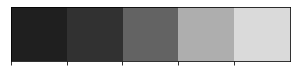

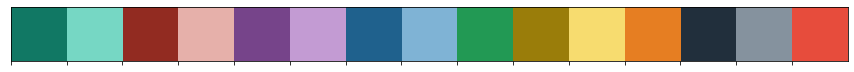

In [105]:
#SELECTING COLORS THAT CAN BE USED FOR THE PLOTTING BELOW
colors_dark = ["#1F1F1F", "#313131", '#636363', '#AEAEAE', '#DADADA']
sns.palplot(colors_dark)
#colors_mix = ["#17869E", '#264D58', '#179E66', '#D35151', '#E9DAB4', '#E9B4B4', '#D3B651', '#6351D3']
colors_mix = ['#117864', '#76D7C4', '#922B21','#E6B0AA','#76448A', '#C39BD3', '#1F618D', '#7FB3D5', '#229954', '#9A7D0A', '#F7DC6F','#E67E22', '#212F3C', '#85929E','#E74C3C']
sns.palplot(colors_mix)

In [106]:
cluster_labels

array([0, 1, 2, ..., 1, 3, 3])

###Plotting 2D and 3D modelling of the data points using scatterplot. We got eight clusters. 
DBSCAN checks for clusters by checking the ε-neighborhood of every point in the database. DBSCAN does not require specifying the number of clusters in the data a priori.

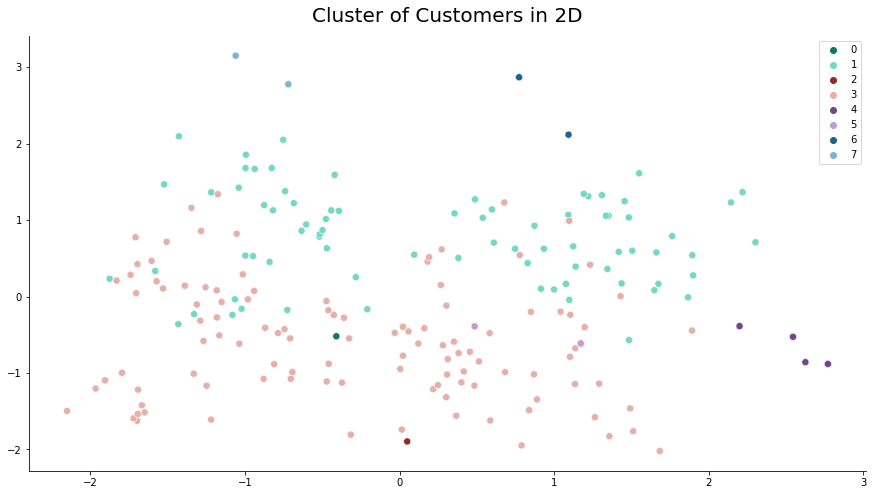

In [107]:
#PLOTING IN 2D TO SEE HOW CLUSTERS BEEN PREDICTED
pca = PCA(2)
pca.fit(X)
X_PCA = pca.transform(X)
plt.figure(figsize=(15,8))
sns.scatterplot(x=X_PCA[:, 0], y=X_PCA[:, 1], hue=cluster_labels, palette=[colors_mix[0],colors_mix[1], colors_mix[2],colors_mix[3], colors_mix[4],colors_mix[5],colors_mix[6],colors_mix[7]], s=50)
plt.title('Cluster of Customers in 2D', size=20, pad=14)
sns.despine()
plt.legend(loc=0, bbox_to_anchor=[1,1])
plt.show()

In [108]:
#PLOTTING THE CLUSTERS IN 3D
pca = PCA(3)
pca.fit(X)
X_PCA = pca.transform(X)


fig = px.scatter_3d(x=X_PCA[:,0], y=X_PCA[:,1], z=X_PCA[:,2], color=cluster_labels,opacity=0.8,
                    color_continuous_scale=[colors_mix[0],colors_mix[1], colors_mix[2],colors_mix[3], colors_mix[4],colors_mix[5],colors_mix[6],colors_mix[7],colors_mix[8],colors_mix[9],colors_mix[10],colors_mix[11],colors_mix[12],colors_mix[13]],
                    width=800,height=800)




fig.update_layout(font_family='monospace',
    title=dict(text='Customer Clusters in 3D',x=0.5,y=0.95,
    font=dict(color=colors_dark[2],size=20)),
    coloraxis_showscale=False)
fig.show()

# D. Evaluation
iii. Silhoutte Score

In [109]:
silhouette_score(X,cluster_labels)

0.08823509749536382

For n_clusters = 8, the silhoutte score is 0.08823509749536382
It works effectively of looking for regions in the information that have a high thickness of perceptions, versus region of the information that are not exceptionally thick with perceptions.